# Flow Intercepting Facility Location Problems (FIFLP)

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Problem-Description" data-toc-modified-id="Problem-Description-1">Problem Description</a></span><ul class="toc-item"><li><span><a href="#p-Median" data-toc-modified-id="p-Median-1.1">p Median</a></span></li><li><span><a href="#Integer-programming-model:" data-toc-modified-id="Integer-programming-model:-1.2">Integer programming model:</a></span></li></ul></li><li><span><a href="#Setup" data-toc-modified-id="Setup-2">Setup</a></span></li><li><span><a href="#Example" data-toc-modified-id="Example-3">Example</a></span><ul class="toc-item"><li><span><a href="#Random-Data" data-toc-modified-id="Random-Data-3.1">Random Data</a></span></li><li><span><a href="#Road-Network-Data" data-toc-modified-id="Road-Network-Data-3.2">Road Network Data</a></span></li></ul></li></ul></div>

## Problem Description

### 截流-选址问题

1990年，Hodgson[1]提出了首个基于流量的选址模型，流量捕获选址模型 (Flow-Capturing Location Model, FCLM) ，1992年，Berman[2]等提出了截流选址模型 (Flow－Intercepting LocationModel, FILM) ，这是目前公认的关于截流选址模型的开拓性文献，在这些模型中，需求主要通过事先确定的路线 ( 通常是起点和终点 (O-D) 之间的最短路径) 上的流量来定义，研究了在顾客流路径和流量需求确定的条件下，如何选址使通过服务设施的流量总和达到最大的截流问题，并建立了此类问题的基本模型，提出了启发式算法进行求解。这些模型假设只有当路径上存在服务设施时，流量才能被捕获，Berman 等放松了这一假设，提出这些路径 “附近”的设施仍然对消费者具有 “效用”，将消费者偏离原路径的这部分 “额外距离”定义为偏离距离，并对考虑偏移距离的截留选址问题进行了研究。
Mirchandani等[3]证明了传统的截流选址问题是NP-hard问题，因此计算时间随节点数量呈指数增长。

截流-选址问题主要分为以下两大类：

### 1. 面向流的问题 (Flow Oriented Problems)

定义网络$N(V,a)$，$V = {i}$为节点集合， $a={l}$为链路集合，$P = {P}$为在网络上选择的起始-目的$(O-D)$地路径集合，$V_{p}$为属于路径P的节点集合，$F={f_{p}}$定义为属于P的路径上的流的集合，$m$定义为网络上要定位的设施的数量。同时，定义两类决策变量：节点变量$y_{i}$和路径变量$x_{p}$，它们的取值为: 

**1.1 最大流量拦截模型 (Maximization of the Intercepted Flow)**

模型的解返回m个设施的位置，从而使拦截流量最大化。目标函数表示截获流量的最大化。
约束(1)规定了必须放置的设施的数量。约束(2)是两类变量之间的一致性约束。实际上，如果路径p上没有一个顶点包含设施(即所有yi都等于0,i∈Vp)，则变量xp必须等于0，即路径p不被拦截。否则，如果路径p的至少一个顶点包含一个设施(即变量yi, i∈Vp，等于1)，则变量xp可以是0或1。由于目标函数的最大化，变量xp假设值为1，即路径p被截取。如上所述，即使路径流遇到多个设施，在目标函数中也只会被拦截和计数一次(即目标函数公式不允许多次计数)。

*Parameters*:
* ***I*** : Collection of demand point locations
* ***h<sub>i</sub>*** : Number of customers at point i
* ***P*** : Total number of facilities
* ***d<sub>ij</sub>*** : Distance between point i and point j

*Decision variables*:
$$
X_i= \begin{cases}1, & \text { Build facilities at point } i \\ 0, & \text { else }\end{cases}\\
Y_{i j}= \begin{cases}1, & \text { Assign point } i \text { to point } j  \\ 0, & \text { else }\end{cases}
$$

###  Integer programming model:
\begin{array}{lll}
\min & \sum_{p \in P}f_{p}x_{p} & \\
\text { s.t. } & \sum_{i \in V}y_{i}\;=\;m, & \\
& \sum_{i \in V_{p}}y_{i} \;\ge\; x_{p} ,& \forall p \in P, \\
& x_{p}\;=\;\{0, 1\}, & \forall p \in P, \\
& y_{i}\;=\;\{0, 1\}, & \forall i \in V.
\end{array}


$\begin{array}
\displaystyle \textbf{Where:}\\
& & \displaystyle V & \small = & \textrm{网络节点集合} \\
& & \displaystyle P & \small = & \textrm{网络中选择的起始-目的$(O-D)$地路径集合} \\
& & V_{p} & \small = & \textrm{路径$p$上的节点集合}  \\
& & f_{p} & \small = & \textrm{路径$p$上的流量 }  \\
& & m & \small = & \textrm{选择设施数量 number of facilities to be located} \\
& & x_{p} & \small = & \begin{cases}
              1, \textrm{if at least one facility is located on path p} \\
              0, \textrm{otherwise} \\
           \end{cases} \\
& & y_{i} & \small = & \begin{cases}
              1, \textrm{if a facility is located at node i}\\
              0, \textrm{otherwise}
           \end{cases} \\
\end{array}$

**1.2 最小化截流设施数量 (Minimization of the Number of Flow Intercepting Facilities)**
模型的目标是最大限度地减少所需的设施数量，以拦截流经网络的指定百分比的总流量或整个流量。目标函数表示设施数量的最小化。约束集(3)与前面的模型相同。约束(4)对截流量施加了一个下界。同样，在这个模型中，一条路径可能会被多个设施拦截，而我们并不确切知道是哪个设施拦截了它。然而，在这种情况下，对于每个设施，模型确保至少有一个明确的分配，否则其中一个设施将是多余的。

$\begin{array}
\displaystyle \textbf{Minimize} & & \sum_{i \in V}y_{i} &  & (1)\\
\displaystyle \textbf{Subject to:}& & \sum_{i \in V_{p}}y_{i}\;\ge\;x_{p} & \forall p \in P & (2)\\
& & \sum_{p \in P}f_{p}x_{p} \;\ge\; K_{ϵ} ,& & (3)\\
& &  K_{ϵ} \;=\; (1-ϵ)\sum_{p \in P}f_{p} ,& & (4)\\
& & x_{p}\;=\;\{0, 1\}, & \forall p \in P & (5)\\
& & y_{i}\;=\;\{0, 1\}, & \forall i \in V & (6)\\
\end{array}$

$\begin{array}
\displaystyle \textbf{Where:}\\
& & \displaystyle V & \small = & \textrm{网络节点集合} \\
& & \displaystyle P & \small = & \textrm{网络中选择的起始-目的$(O-D)$地路径集合} \\
& & V_{p} & \small = & \textrm{路径$p$上的节点集合}  \\
& & f_{p} & \small = & \textrm{路径$p$上的流量 }  \\
& & \displaystyle ϵ & \small = & \textrm{总流量中必须被拦截的部分$(0 \le ϵ \le 1)$} \\
& & K_{ϵ} & \small = & \textrm{被拦截后路径$p$的流量} \\
& & x_{p} & \small = & \begin{cases}
              1, \textrm{if at least one facility is located on path p} \\
              0, \textrm{otherwise} \\
           \end{cases} \\
& & y_{i} & \small = & \begin{cases}
              1, \textrm{if a facility is located at node i}\\
              0, \textrm{otherwise}
           \end{cases} \\
\end{array}$

        

## Setup

In [1]:
import random
from itertools import product
import numpy as np
from location.FModel import *
import pandas as pd
import matplotlib.pyplot as plt
import osmnx as ox
from pulp import *
from itertools import product
import pandas as pd

# Example

In [2]:
random.seed(1)
solver_list = listSolvers(onlyAvailable=True)
print(solver_list)  # 可用求解器输出

Restricted license - for non-production use only - expires 2024-10-28
No parameters matching '_test' found
['GLPK_CMD', 'GUROBI', 'GUROBI_CMD']


# Random Data

In [3]:
n = 10  # facility candidate sites
p = 5 # path num
m = 2   # choice facility
V = list(range(n))
df= [(random.random(), random.random()) for i in range(n)] # V 位置信息
P = list(range(p))
fp = [random.randint(5, 10) for i in range(p)]
Vp = [[0,1],[2,3],[4,5],[6,7],[8,9]]
e = 0.3 # [0,1]                                         # 1-ϵ :总流量中必须被拦截的部分 [0,1]
Ke = (1-e) * sum(fp)                                      # Kϵ :对应的流量值

## Plot Random Data

# Road Network Data

In [4]:
rdf = pd.read_csv('北京POI裁剪.csv',encoding='gbk')
rdf = rdf.query('adname=="东城区" | adname=="西城区" | adname=="朝阳区" | adname=="海淀区"').reset_index(drop=True)
data = rdf[['long', 'lat']]
num_points = rdf.shape[0]
num_located = 10
np.random.seed(0)
num_people = np.random.randint(1,2, size=num_points)
cartesian_prod = list(product(range(num_points), range(num_points)))
points = [(data['long'][i], data['lat'][i]) for i in range(num_points)]
rn = 118  # facility candidate sites
rp = 59  # path num
rm = 5   # choice facility
rV = list(range(rn))
rP = list(range(rp))
rfp = [random.randint(1, 10) for i in range(rp)]
rVp = [[2*i, 2*i+1] for i in range(rp)]
re = 0.3 # [0,1]                                         # 1-ϵ :总流量中必须被拦截的部分 [0,1]
rKe = (1-e) * sum(rfp)

In [5]:
G = ox.graph_from_address('Beijing', dist=20000, network_type='drive')

## Plot  Road Network Data

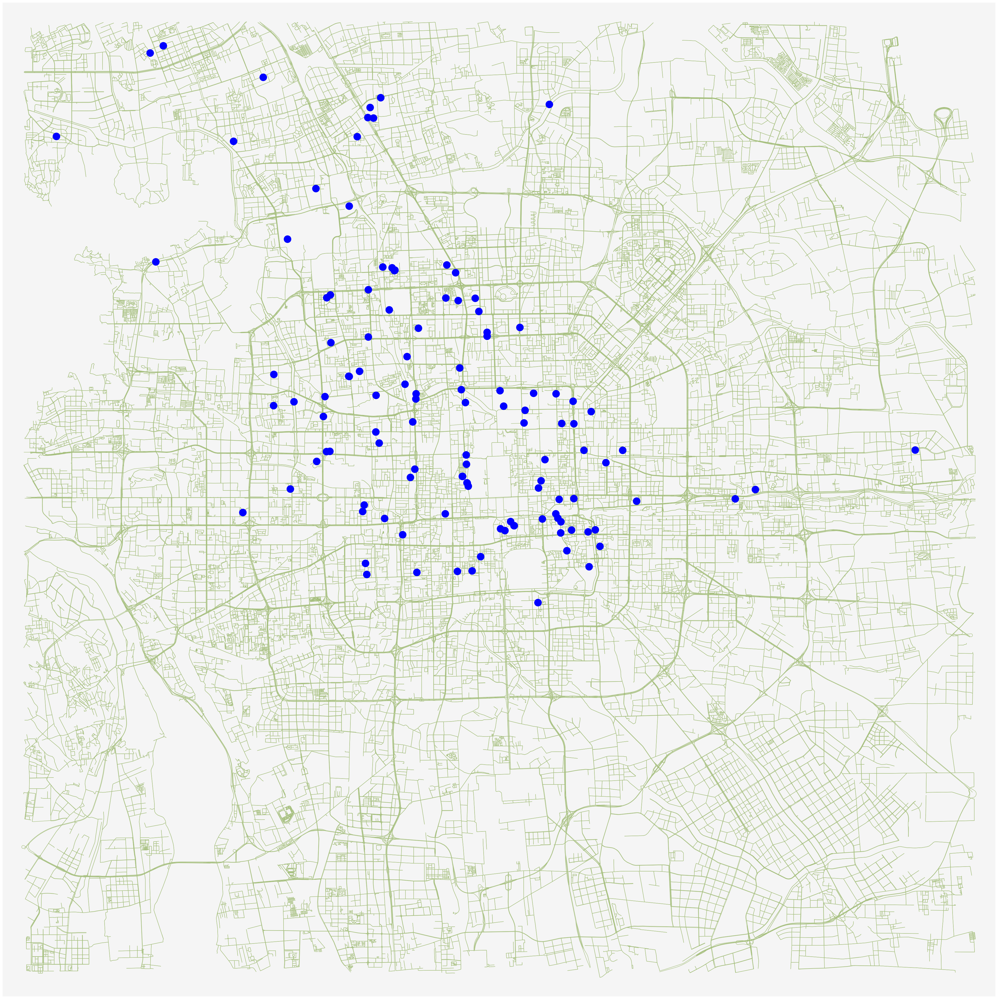

In [6]:
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
for j in range(num_points):
    lx = rdf['lat'][j]
    ly = rdf['long'][j]
    plt.plot(ly, lx, c='b', marker='o', markersize=20,zorder=2)
plt.show()

# Minimization of the Number of Flow Intercepting Facilities

## Solve  Random Data

In [7]:
selected_path, selected_vector= MinimumFlowInterceptionModel(num_path=P,
                              num_vector=V,
                              path_vector=Vp,
                              path_flow=fp,
                              intercept_e=Ke,
                              solver=GUROBI_CMD()).prob_solve()

Status: Optimal
Selected paths = [1, 2, 4]
Selected points = [3, 4, 8]
Minimum flow = 3.0


D:\Application\Anaconda3\lib\site-packages\pulp\pulp.py:1352: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


## Plot  Random Data solution

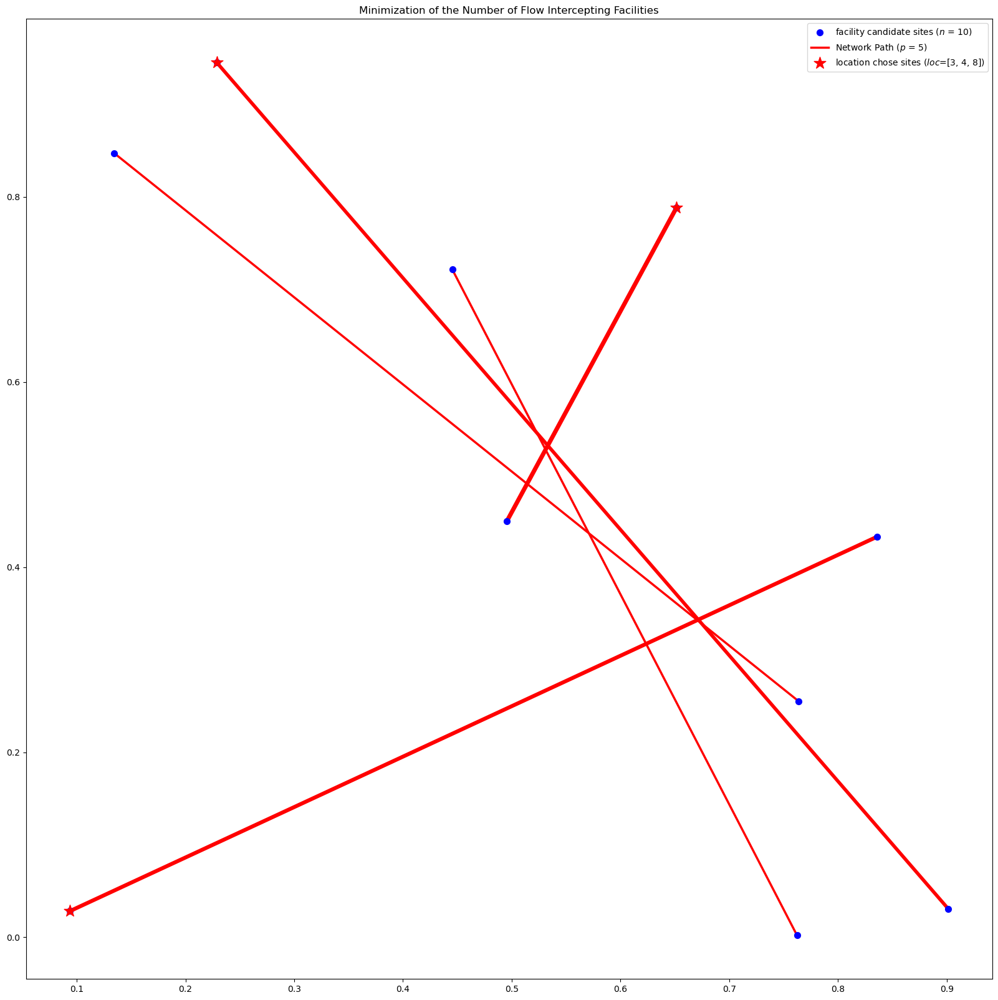

In [8]:
plt.figure(figsize=(20, 20))
plt.title('Minimization of the Number of Flow Intercepting Facilities')
loc=[]
for i in selected_vector:
    loc.append(df[i])
plt.scatter(*zip(*df), c='Blue', marker='o', s=50, label=f"facility candidate sites ($n$ = {n})",zorder=2)

for j, i in enumerate(Vp):
    if j==0:
        plt.plot([df[i[0]][0], df[i[1]][0]], [df[i[0]][1], df[i[1]][1]],c='red',
                 linewidth=0.5 * fp[j],label=f"Network Path ($p$ = {len(Vp)})",zorder=1)
    else:
        plt.plot([df[i[0]][0], df[i[1]][0]], [df[i[0]][1], df[i[1]][1]], c='red', linewidth=0.5 * fp[j], zorder=1)

plt.scatter(*zip(*loc), c="r", marker='*', s=200, label=f"location chose sites ($loc$={list(selected_vector)})", zorder=3)
plt.legend(loc='best', fontsize=10)
plt.show()

## Solve Road Network Data 

In [9]:
rselected_path, rselected_vector= MinimumFlowInterceptionModel(num_path=rP,
                              num_vector=rV,
                              path_vector=rVp,
                              path_flow=rfp,
                              intercept_e=rKe,
                              solver=GUROBI_CMD()).prob_solve()

Status: Optimal
Selected paths = [1, 3, 5, 6, 7, 12, 15, 16, 22, 23, 24, 28, 29, 30, 31, 32, 34, 36, 37, 40, 43, 44, 47, 48, 50, 52, 55, 56, 57, 58]
Selected points = [3, 6, 10, 13, 15, 25, 31, 33, 44, 46, 49, 57, 59, 60, 63, 64, 69, 72, 75, 80, 87, 88, 95, 97, 101, 105, 111, 113, 114, 117]
Minimum flow = 30.0


## Plot Road Network Data solution

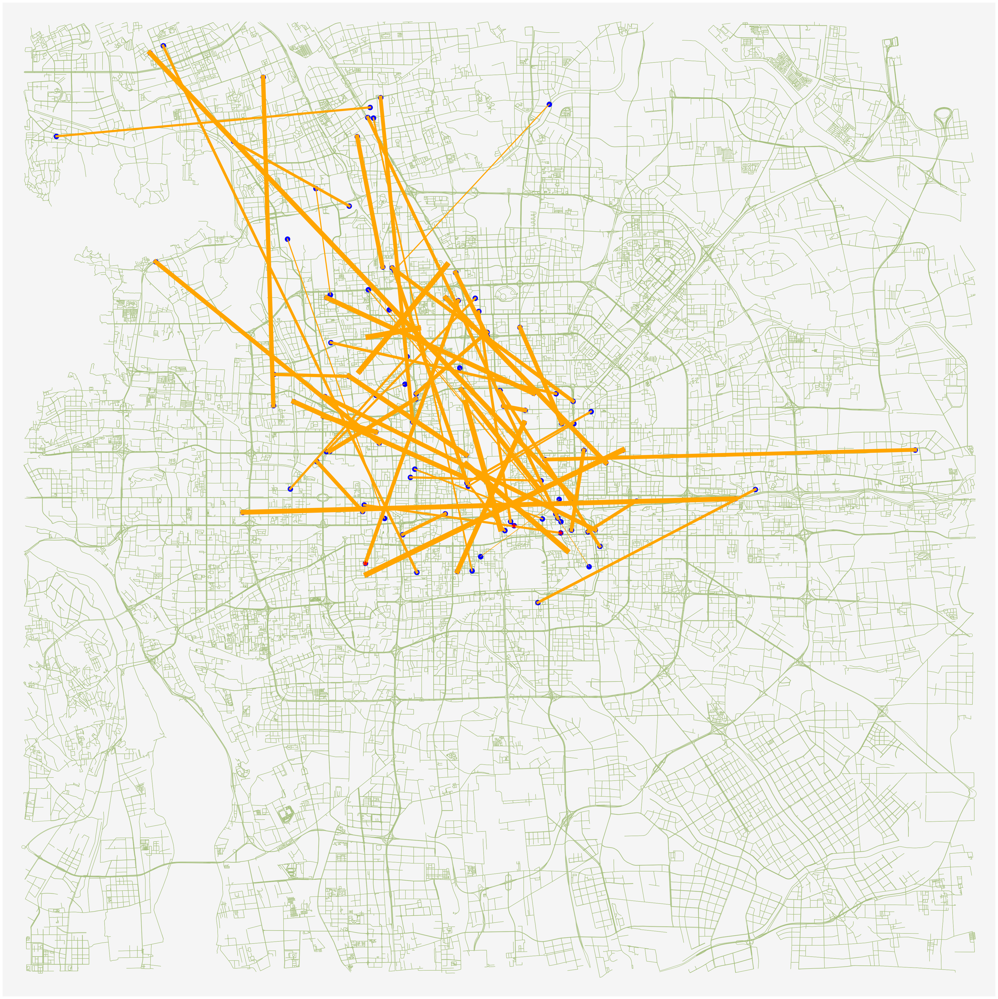

In [10]:
ox.plot_graph(G, figsize=(50,50),bgcolor="#F5F5F5",node_size=0,edge_color = "#A4BE7B", show=False, close=False)
loc=[]
for i in selected_vector:
    loc.append(points[i])
plt.scatter(*zip(*points), c='Blue', marker='o', s=200,zorder=1)
#Lines
for j, i in enumerate(rVp):
   plt.plot([points[i[0]][0], points[i[1]][0]], [points[i[0]][1], points[i[1]][1]], c='Orange', linewidth=1.5 * rfp[j], zorder=2)
plt.scatter(*zip(*loc), c="r", marker='*', s=200, zorder=3)
plt.show()